In [44]:
import os
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np

In [29]:
scale_file = "scale.wav"
debussy_file = "debussy.wav"
redhot_file = "redhot.wav"
duke_file = "duke.wav"

In [30]:
ipd.Audio(scale_file)

In [31]:
ipd.Audio(debussy_file)

In [32]:
ipd.Audio(redhot_file)

In [33]:
ipd.Audio(duke_file)

In [34]:
scale, sr = librosa.load(scale_file)
debussy, _=librosa.load(debussy_file)
redhot, _=librosa.load(redhot_file)
duke, _=librosa.load(duke_file)

In [35]:
#Extracting Short-Time Fourier Transform
FRAME_SIZE = 2048
HOP_SIZE = 512

In [36]:
S_scale = librosa.stft(scale,n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [37]:
S_scale.shape

(1025, 342)

In [38]:
type(S_scale[0][0])

numpy.complex64

In [39]:
# Calculating the spectrogram
Y_scale = np.abs(S_scale) ** 2

In [40]:
Y_scale.shape

(1025, 342)

In [41]:
type(Y_scale[0][0])

numpy.float32

In [42]:
#Visualize 
def plot_spectrogram(Y, sr, hop_length, y_axis='linear'):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y,
                            sr=sr,
                            hop_length=hop_length,
                            x_axis="time",
                            y_axis=y_axis)
    plt.colorbar(format="%+2.f")

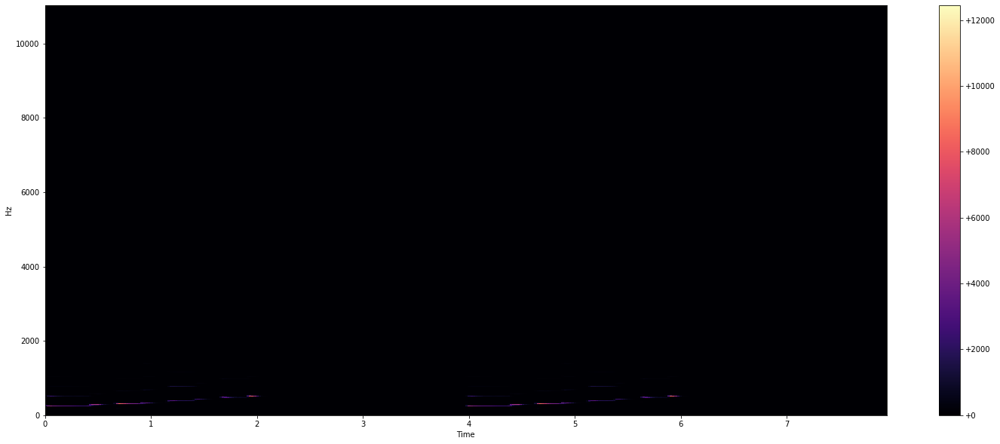

In [45]:
plot_spectrogram(Y_scale,sr,HOP_SIZE)

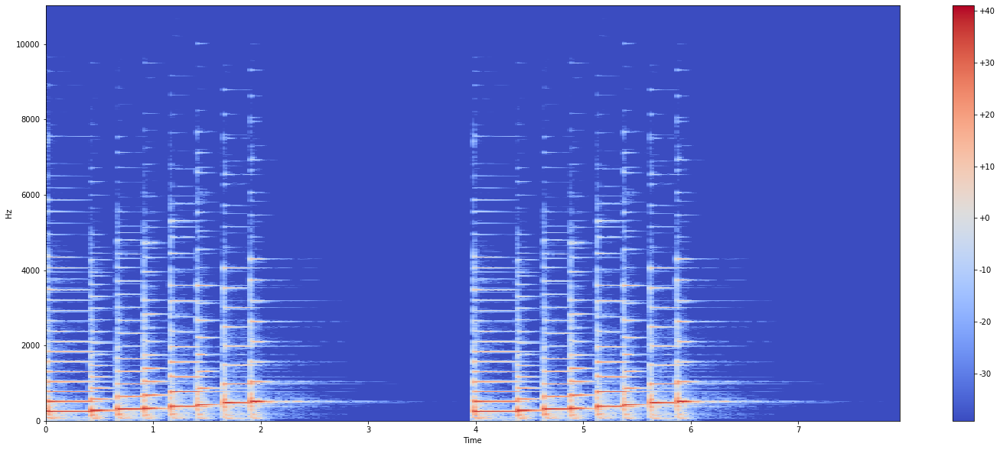

In [46]:
#Log amplitude Spectrogram
Y_log_scale=librosa.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale, sr , HOP_SIZE)

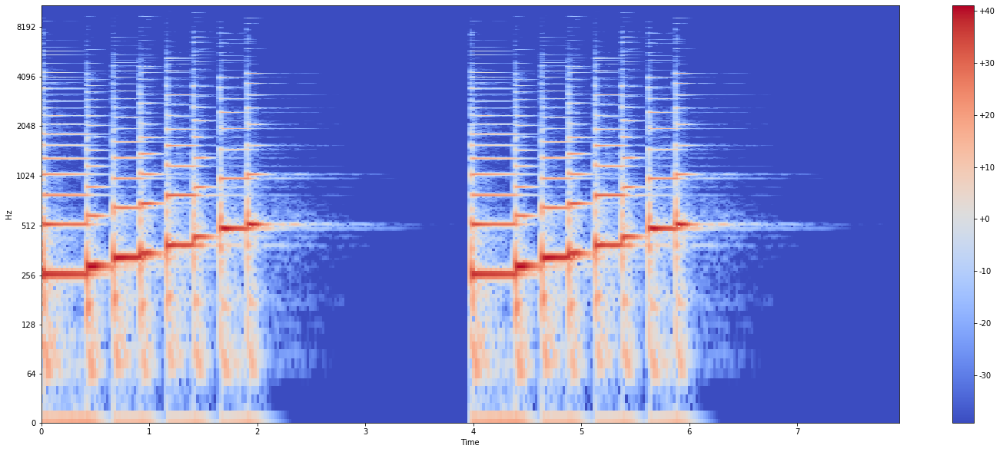

In [47]:
#Log frequency Spectrogram
plot_spectrogram(Y_log_scale,sr,HOP_SIZE,y_axis="log")

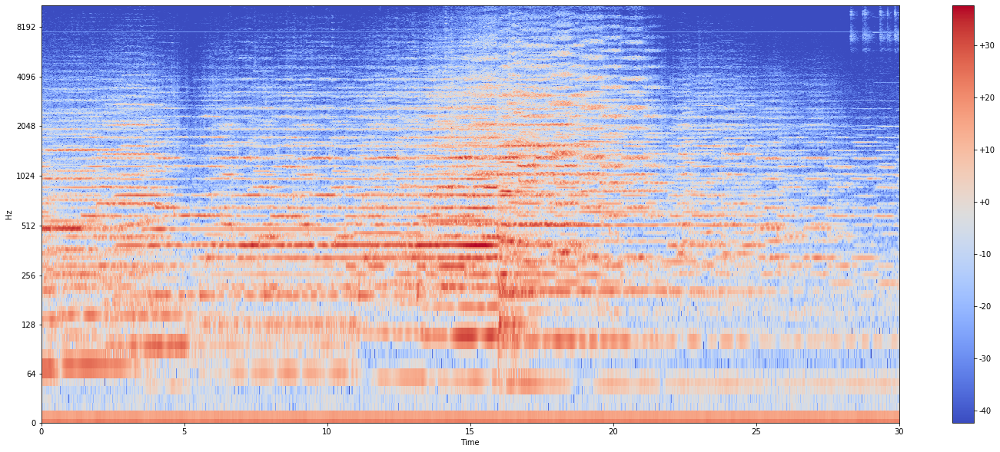

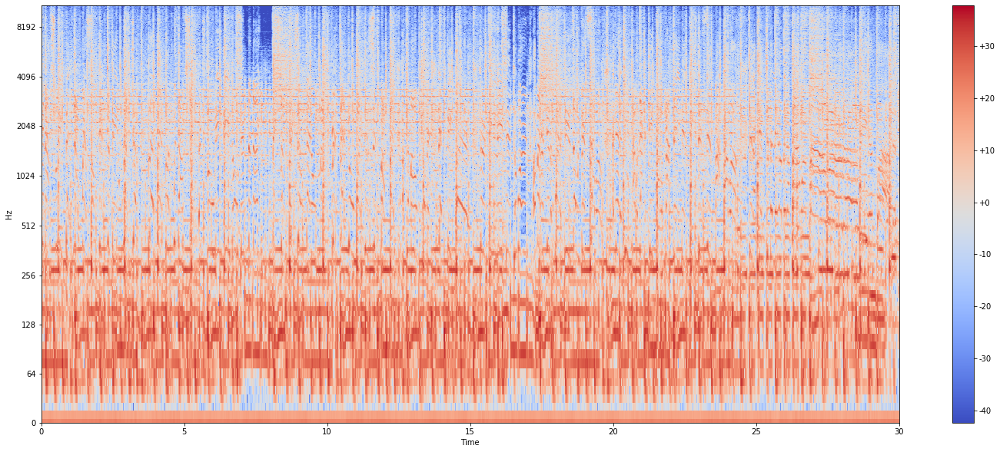

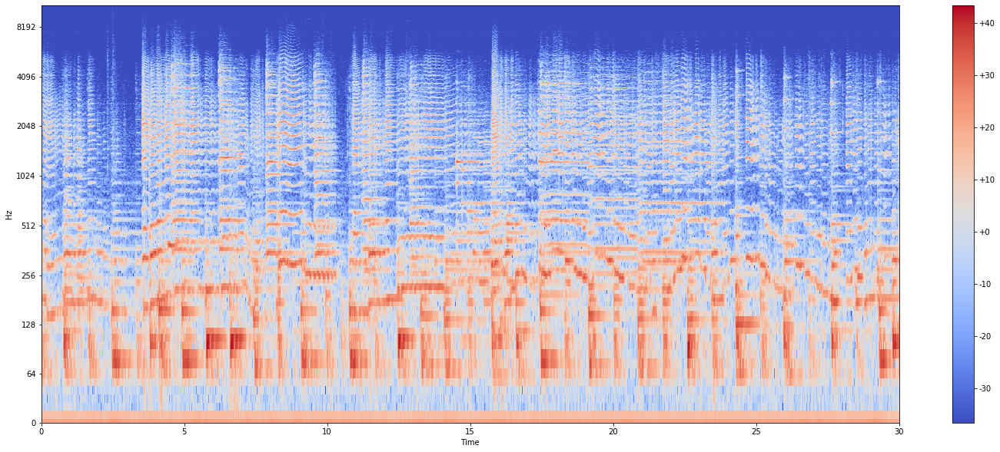

In [49]:
#Visulaising songs from different genres
S_debussy = librosa.stft(debussy, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_redhot = librosa.stft(redhot, n_fft = FRAME_SIZE, hop_length=HOP_SIZE)
S_duke = librosa.stft(duke, n_fft = FRAME_SIZE,hop_length=HOP_SIZE)

Y_debussy = librosa.power_to_db(np.abs(S_debussy) ** 2)
Y_redhot = librosa.power_to_db(np.abs(S_redhot) ** 2)
Y_duke = librosa.power_to_db(np.abs(S_duke) ** 2)

plot_spectrogram(Y_debussy,sr,HOP_SIZE,y_axis = "log")
plot_spectrogram(Y_redhot,sr,HOP_SIZE,y_axis="log")
plot_spectrogram(Y_duke,sr,HOP_SIZE,y_axis = "log")